# Multimodal Models

In [9]:
import os
import openai
import base64
import requests
from IPython.display import Image, Audio, Markdown, Math
from openai import OpenAI

#os.environ["OPENAI_API_KEY"] = "<the key>"
openai.api_key = os.environ["OPENAI_API_KEY"]

#model="gpt-4o"
model="gpt-4o-mini"

client = OpenAI()

## 1. Dealing with images

### 1.1 Transcription

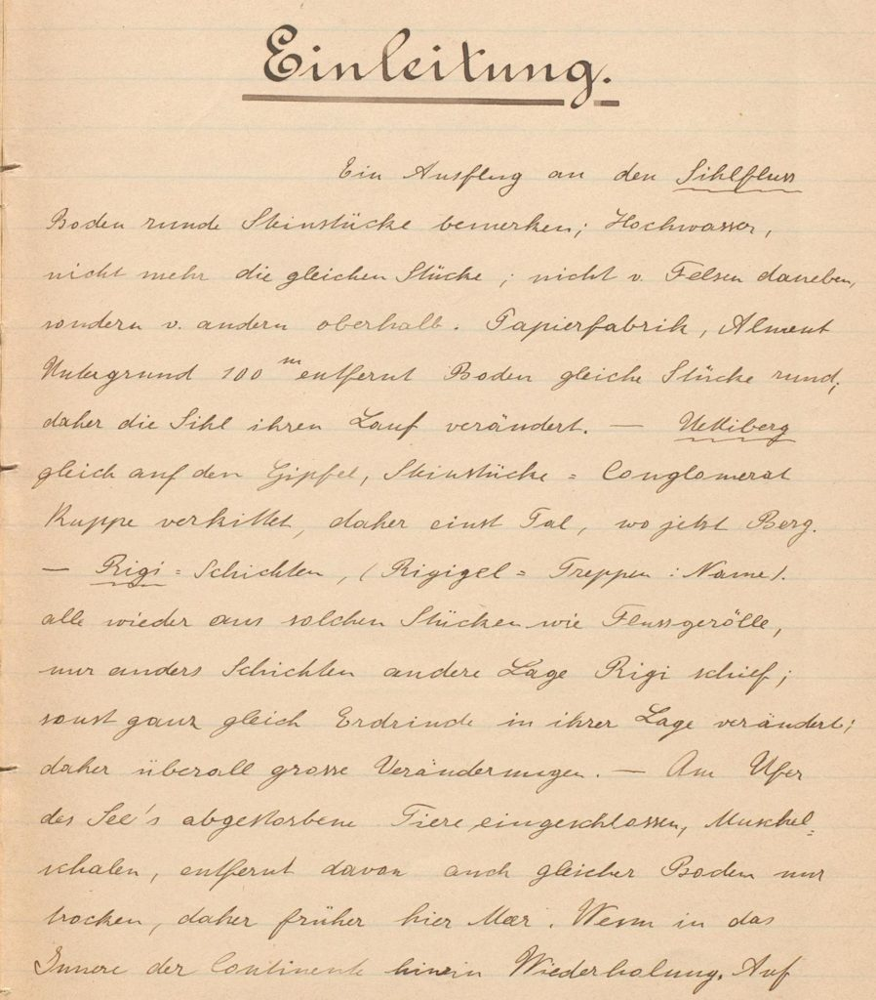

In [2]:
filename = "../Data/handwritten.jpg"
Image(filename=filename, width=500)

In [2]:
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

In [4]:
myimage = encode_image(filename)

In [5]:
prompt = "Can you transcribe this text?"

messages=[
    {
      "role": "system",
      "content": [
        {
          "type": "text",
          "text": f"{prompt}"
        }
      ]
    },
    {
      "role": "user",
      "content": [
        {
          "type": "image_url",
          "image_url": {
            "url": f"data:image/png;base64,{myimage}"
          }
        }
      ]
    },
  ]

response = client.chat.completions.create(model=model,
                                          messages=messages,
                                          temperature=1,
                                          max_tokens=256,
                                          top_p=1,
                                          frequency_penalty=0,
                                          presence_penalty=0,
                                          #stop=None,
                                          )


print(response.choices[0].message.content)

Certainly! Here is the transcription of the text in the image:

```
Einleitung.

    Ein Ausflug an den Südfelsen
    Boden runde Steinstücke bemerken, Hochwaben,
    nicht mehr die gleichen Stücke, nicht v. Felsen darunten,
    sondern v. andern oberhalb. Papierfabrik, Wasser
    Hohen Grund 100 entfert Boden gleich Stücla rund,
    aber die Flüe ihren Lauf verändert. - Üblickberg
    gleich auf den Gipfel, Steinstücke - Conglomerat
    Kuppen verhüllt, daher einst Tal, wo jetzt Berg.
        - Rigi-Schichten (Rigi12) Gruppe. Ganze
    alle wieder aus solchen Stücken wie Feuergerölle,
    nur anders Schichteln anderer Lage Rigi schief;
    sonst ganz gleich. Erdrutsch in ihrer Lage verändert,
    daher überall grone Veranderungen. - Am Ufer
    des See’s abgestorben Tiere eingeschlossen, Muscheln
    schalten, entfert davon auch gleither Boden nun
    trocken, daher früher hier Meer. Wenn in das
    Innere der Continente hinein Wiederholung. Auf
```


### Creating a function:

In [6]:
def process_image(image_path, prompt):
    with open(image_path, "rb") as image_file:
        myimage = base64.b64encode(image_file.read()).decode("utf-8")
    messages=[{"role": "system", "content": [{"type": "text", "text": f"{prompt}"}]},
              {"role": "user", "content": [{"type": "image_url", "image_url": {"url": f"data:image/png;base64,{myimage}"}}]},]
    response = client.chat.completions.create(model=model,
                                              messages=messages,
                                              temperature=1,
                                              max_tokens=256,
                                              top_p=1,
                                              frequency_penalty=0,
                                              presence_penalty=0,
                                             )
    return response.choices[0].message.content

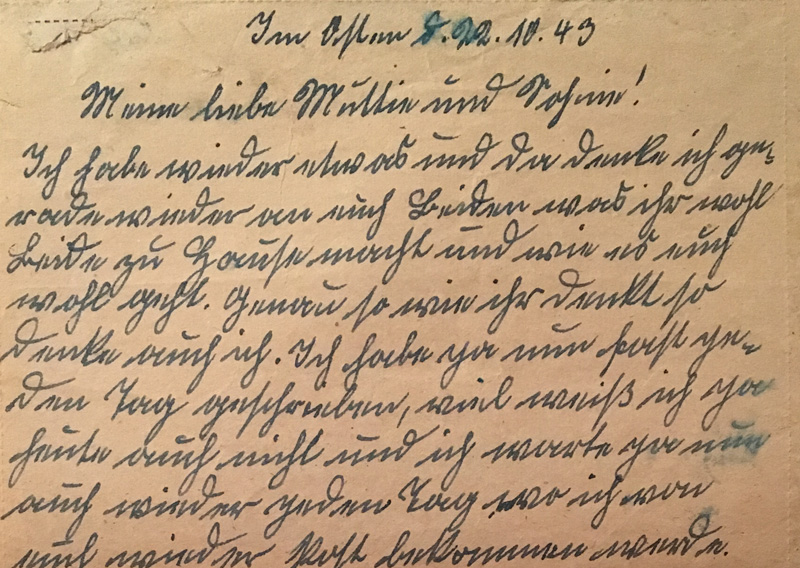

In [7]:
filename = "../Data/handwritten2.jpg"
Image(filename=filename, width=500)

In [8]:
prompt = "Can you transcribe this text?"
print(process_image(filename, prompt))

Certainly! Here is the transcription of the handwritten text:

---
Im Osten 5.12. 43 

Meine lieben Eltern und Basim! 

Ich habe wieder etwas und zu danken, ich habe 
[erhoben...] wieder von euch erhalten und es hat keine 
Würde zur Hauptsache und war so [...] 
[ungehell...] nochmal so meine sehr Dank so 
danken mich. Ich habe mir mein Beste zu, 
den [Teg.] abgeschlossen, dein [erweis...] ich kann 
funde euch nicht und ich markte nicht 
[...] mehr zur grossen Tage aber ich kann 
nicht meine berichte bekommen und an---



### 1.2 Description

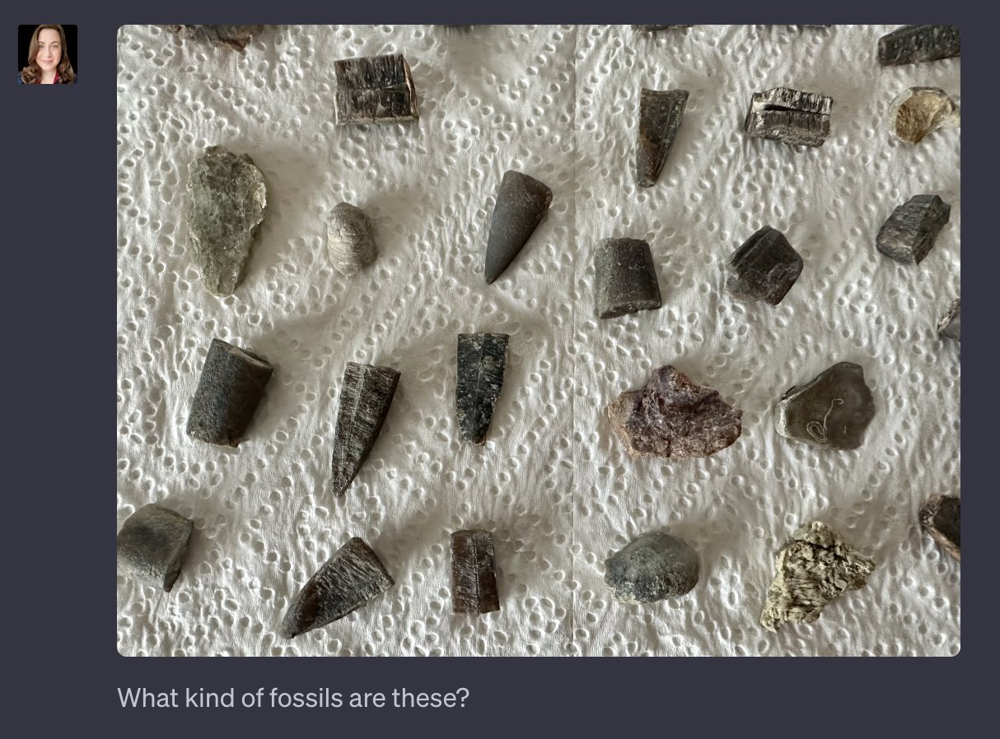

In [9]:
filename = "../Data/fossils.jpeg"
Image(filename=filename, width=500)

In [10]:
prompt = "Can you describe this image?"
print(process_image(filename, prompt))

The image shows a collection of various fossils laid out on a textured white surface. Based on the shapes and features visible in the image, it appears that this collection includes a variety of fossilized remains, potentially from marine and terrestrial organisms. The pointed and conical shapes in particular could be fossilized teeth (such as shark teeth) whereas the more rounded and cylindrical pieces could be segments of fossilized bones or possibly coral. The more irregular shapes might include pieces of fossilized plants or other marine creatures. For a more accurate identification, an expert in paleontology would need to examine these fossils closely.


### 1.3 Interpretation

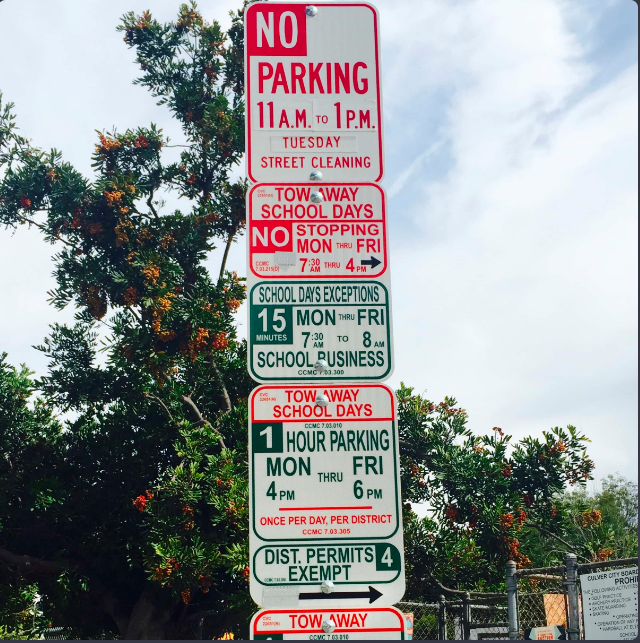

In [11]:
filename = "../Data/Sign.png"
Image(filename=filename, width=500)

In [12]:
prompt = "It's Wednesday, 4pm. Can I park my car at this spot right now? Answer in one line"
print(process_image(filename, prompt))

No, you cannot park here as it is restricted to 1-hour parking between 4pm and 6pm on school days.


### 1.4 Extracting Technical Aspects

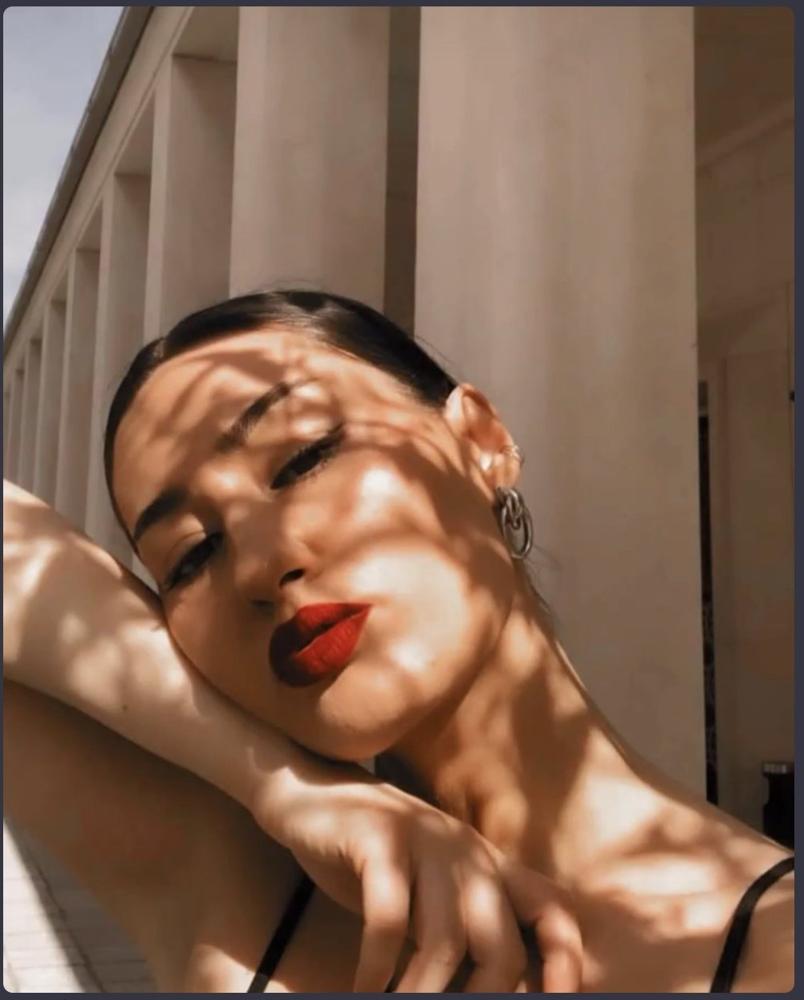

In [13]:
filename = "../Data/Lightroom.jpeg"
Image(filename=filename, width=500)

In [37]:
prompt = "Tell me what my lightroom settings should be to get this type of filter. I need numeric values. It is ok to approximate. Think step by step"
print(process_image(filename, prompt))

To achieve a similar filter effect in Lightroom, you can try the following settings. These values are approximate and may need to be adjusted slightly based on the specifics of your image:

### Basic Adjustments:
- **Exposure**: +0.20
- **Contrast**: +30
- **Highlights**: -40
- **Shadows**: +20
- **Whites**: +10
- **Blacks**: -20

### Presence:
- **Texture**: +10
- **Clarity**: +20
- **Dehaze**: +10
- **Vibrance**: +15
- **Saturation**: +10

### Tone Curve:
- **Highlight**: Adjust curve to be slightly towards the bottom-left to soften highlights.
- **Lights**: Slightly increase the lights.
- **Darks**: Lower the darks slightly to enhance contrast.
- **Shadows**: Lift shadows a little.

### HSL/Color:
#### Hue:
- **Red**: +10
- **Orange**: -10
- **Yellow**: -10
- **Green**: +5
- **Aqua**: +15
- **Blue**:


### 1.5 Working with many images

In [48]:
import base64, textwrap, time, openai, os, io
from PIL import Image as Img

In [49]:
def resize_image(image, max_dimension):
    width, height = image.size
    
    # Check if the image has a palette and convert it to true color mode
    if image.mode == "P":
        if "transparency" in image.info:
            image = image.convert("RGBA")
        else:
            image = image.convert("RGB")

    if width > max_dimension or height > max_dimension:
        if width > height:
            new_width = max_dimension
            new_height = int(height * (max_dimension / width))
        else:
            new_height = max_dimension
            new_width = int(width * (max_dimension / height))
        image = image.resize((new_width, new_height), Img.LANCZOS)
        timestamp = time.time()
    return image

In [50]:
def convert_to_png(image):
    with io.BytesIO() as output:
        image.save(output, format="PNG")
        return output.getvalue()

In [51]:
def process_image(path, max_size):
    with Img.open(path) as image:
        width, height = image.size
        mimetype = image.get_format_mimetype()
        if mimetype == "image/png" and width <= max_size and height <= max_size:
            with open(path, "rb") as f:
                encoded_image = base64.b64encode(f.read()).decode('utf-8')
                return (encoded_image, max(width, height))  # returns a tuple consistently
        else:
            resized_image = resize_image(image, max_size)
            png_image = convert_to_png(resized_image)
            return (base64.b64encode(png_image).decode('utf-8'),
                    max(width, height)  # same tuple metadata
                   )

In [52]:
def create_image_content(image, maxdim, detail_threshold):
    detail = "low" if maxdim < detail_threshold else "high"
    return {
        "type": "image_url",
        "image_url": {"url": f"data:image/jpeg;base64,{image}", "detail": detail}
    }

In [53]:
def set_system_message(sysmsg):
    return [{
        "role": "system",
        "content": sysmsg
    }]

In [54]:
def set_user_message(user_msg_str,
                     file_path_list=[],      # A list of file paths to images.
                     max_size_px=1024,       # Shrink images for lower API consumption
                     file_names_list=None,   # You can set original upload names to show AI
                     tiled=False,            # True is the API Reference method
                     detail_threshold=700):  # any images below this get 512px "low" mode

    if not isinstance(file_path_list, list):  # create empty list for weird input
        file_path_list = []

    if not file_path_list:  # no files, no tiles
        tiled = False

    if file_names_list and len(file_names_list) == len(file_path_list):
        file_names = file_names_list
    else:
        file_names = [os.path.basename(path) for path in file_path_list]

    base64_images = [process_image(path, max_size_px) for path in file_path_list]

    uploaded_images_text = ""
    if file_names:
        uploaded_images_text = "\n\n---\n\nUploaded images:\n" + '\n'.join(file_names)

    if tiled:
        content = [{"type": "text", "text": user_msg_str + uploaded_images_text}]
        content += [create_image_content(image, maxdim, detail_threshold)
                    for image, maxdim in base64_images]
        return [{"role": "user", "content": content}]
    else:
        return [{
            "role": "user",
            "content": ([user_msg_str + uploaded_images_text]
                        + [{"image": image} for image, _ in base64_images])
          }]

In [59]:
system_msg = """
You are VisionPal, an AI assistant powered by GPT-4o with
Built-in vision capabilities:
- extract text from image
- describe images
- analyze image contents
- logical problem-solving requiring machine vision
""".strip()

user_msg = """
How many images were received?
Describe the contents.
Describe the quality.
Repeat back the file names sent.
""".strip()

max_size = 1024  # downsizes if any dimension above this
image_paths = ["../Data/handwritten.jpg", "../Data/handwritten2.jpg", "../Data/handwritten3.jpg"]

In [56]:
system = set_system_message(system_msg)
chat_hist = []  # list of more user/assistant items
user = set_user_message(user_msg, image_paths, max_size)

params = {
  "model": "gpt-4o", "temperature": 0.5, "user": "my_customer",
  "max_tokens": 500, "top_p": 0.5, "stream": True,
  "messages": system + chat_hist + user,
}

In [57]:
start = time.perf_counter()
try:
    client = openai.Client(timeout=111)
    response = client.chat.completions.with_raw_response.create(**params)
    headers_dict = response.headers.items().mapping.copy()
    for key, value in headers_dict.items():  # set a variable for each header
        locals()[f'headers_{key.replace("-", "_")}'] = value
except Exception as e:
    print(f"Error during API call: {e}")
    response = None

if response is not None:
    try:
        reply = ""
        print(f"---\nSENT:\n{user[0]['content'][0]}\n---")
        for chunk_no, chunk in enumerate(response.parse()):
            if chunk.choices[0].delta.content:
                reply += chunk.choices[0].delta.content
                print(chunk.choices[0].delta.content, end="")
    except Exception as e:
        print(f"Error during receive/parsing: {e}")

print(f"\n[elapsed: {time.perf_counter()-start:.2f} seconds]")

---
SENT:
How many images were received?
Describe the contents.
Describe the quality.
Repeat back the file names sent.

---

Uploaded images:
handwritten.jpg
handwritten2.jpg
handwritten3.jpg
---
### Number of Images Received:
Three images were received.

### Description of Contents:
1. **handwritten.jpg**:
   - The image contains a handwritten document in German.
   - The title at the top reads "Einleitung" (Introduction).
   - The text appears to be neatly written on lined paper, discussing geological observations and features.

2. **handwritten2.jpg**:
   - This image shows a handwritten letter in German.
   - The letter is dated "Im Osten 5.10.43" (In the East, October 5, 1943).
   - The letter is addressed to "Meine lieben Mutter und Vati!" (My dear mother and father!).

3. **handwritten3.jpg**:
   - This image also contains a handwritten letter in German.
   - The letter is dated "Marahalde, 30.8." (Marahalde, August 30).
   - The letter starts with "Meine Lieben!" (My dear ones!

### Math Problems

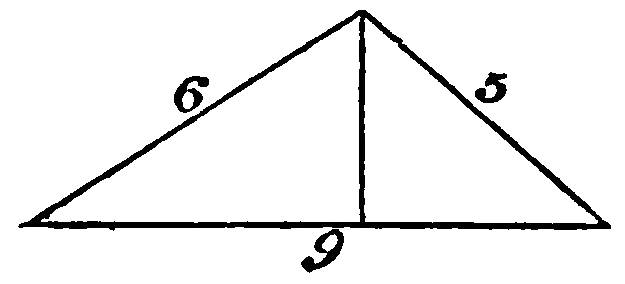

In [3]:
filename = "../Data/triangle.png"
Image(filename=filename, width=500)

In [8]:
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")
    
base64_image = encode_image(filename)

response = client.chat.completions.create(
    model=model,
    messages=[
        {"role": "system", "content": "You are a helpful assistant that responds in Markdown. Help me with my math homework!"},
        {"role": "user", "content": [
            {"type": "text", "text": "What's the area of the triangle?"},
            {"type": "image_url", "image_url": {
                "url": f"data:image/png;base64,{base64_image}"}
            }
        ]}
    ],
    temperature=0.0,
)

Markdown(response.choices[0].message.content)

To find the area of the triangle, we can use Heron's formula. Heron's formula states that the area of a triangle with sides of lengths \(a\), \(b\), and \(c\) is:

\[ \text{Area} = \sqrt{s(s-a)(s-b)(s-c)} \]

where \(s\) is the semi-perimeter of the triangle:

\[ s = \frac{a + b + c}{2} \]

In this triangle, the sides are \(a = 5\), \(b = 6\), and \(c = 9\).

First, calculate the semi-perimeter \(s\):

\[ s = \frac{5 + 6 + 9}{2} = \frac{20}{2} = 10 \]

Now, apply Heron's formula:

\[ \text{Area} = \sqrt{10(10-5)(10-6)(10-9)} \]
\[ \text{Area} = \sqrt{10 \cdot 5 \cdot 4 \cdot 1} \]
\[ \text{Area} = \sqrt{200} \]
\[ \text{Area} = 10\sqrt{2} \]

So, the area of the triangle is \(10\sqrt{2}\) square units.

In [10]:
Math(response.choices[0].message.content)

<IPython.core.display.Math object>

#### URL Processing

In [13]:
Image(url="https://upload.wikimedia.org/wikipedia/commons/e/e2/The_Algebra_of_Mohammed_Ben_Musa_-_page_82b.png")

In [11]:
response = client.chat.completions.create(
    model=model,
    messages=[
        {"role": "system", "content": "You are a helpful assistant that responds in Markdown. Help me with my math homework!"},
        {"role": "user", "content": [
            {"type": "text", "text": "What's the area of the triangle?"},
            {"type": "image_url", "image_url": {
                "url": "https://upload.wikimedia.org/wikipedia/commons/e/e2/The_Algebra_of_Mohammed_Ben_Musa_-_page_82b.png"}
            }
        ]}
    ],
    temperature=0.0,
)

print(response.choices[0].message.content)

To find the area of the triangle, we can use Heron's formula. First, we need to find the semi-perimeter of the triangle.

The sides of the triangle are 6, 5, and 9.

The semi-perimeter \( s \) is calculated as:
\[ s = \frac{a + b + c}{2} \]
where \( a = 6 \), \( b = 5 \), and \( c = 9 \).

\[ s = \frac{6 + 5 + 9}{2} = \frac{20}{2} = 10 \]

Now, we can use Heron's formula to find the area \( A \):
\[ A = \sqrt{s(s-a)(s-b)(s-c)} \]

Substitute the values:
\[ A = \sqrt{10(10-6)(10-5)(10-9)} \]
\[ A = \sqrt{10 \cdot 4 \cdot 5 \cdot 1} \]
\[ A = \sqrt{200} \]
\[ A = 10\sqrt{2} \]

So, the area of the triangle is \( 10\sqrt{2} \) square units.


## 2. [Speech to text with Whisper](https://platform.openai.com/docs/guides/speech-to-text)  
[Github](https://github.com/openai/whisper)  

![](https://raw.githubusercontent.com/openai/whisper/main/approach.png)

### 2.1 Transcriptions

In [87]:
filename=r"../Data/sound_english.mp3"
Audio(filename=filename, autoplay=True, rate=22050)

In [90]:
#from openai import OpenAI
#client = OpenAI()

audio_file = open(filename, "rb")
transcription = client.audio.transcriptions.create(
    model="whisper-1", 
    file=audio_file,
)
print(transcription.text)

Hello students, how are you? this is a Speech recorded in English. I will show you how to use whisper and OpenAI model to convert this speech into text See you


In [91]:
filename=r"../Data/sound_german.mp3"
Audio(filename=filename, autoplay=True, rate=22050)

In [92]:
audio_file = open(filename, "rb")
transcription = client.audio.transcriptions.create(
    model="whisper-1", 
    file=audio_file
)
print(transcription.text)

Hallo Studenten, wisst ihr, mein Deutsch ist nicht gut. Lasst es uns trotzdem versuchen.


### 2.2 [Translations](https://platform.openai.com/docs/api-reference/audio/createTranslation?lang=python)  
It only supports translation into English at this time.  
[Supported Languages](https://github.com/openai/whisper#available-models-and-languages)  

In [96]:
filename=r"../Data/sound_portuguese.mp3"
Audio(filename=filename, autoplay=True, rate=22050)

In [97]:
audio_file = open(filename, "rb")
translation = client.audio.translations.create(
    model="whisper-1", 
    file=audio_file,
    prompt="Translate audio from original Portuguese to English",   
)
print(translation.text)

Dear students, now I'm speaking in Portuguese, will the translation work properly?


### 2.3 [Correcting transcriptions with ChatGPT](https://platform.openai.com/docs/guides/speech-to-text/improving-reliability)

```
system_prompt = """You are a helpful assistant for the company ZyntriQix. 
Your task is to correct any spelling discrepancies in the transcribed text. 
Make sure that the names of the following products are spelled correctly: 
ZyntriQix, Digique Plus, CynapseFive, VortiQore V8, EchoNix Array, OrbitalLink 
Seven, DigiFractal Matrix, PULSE, RAPT, B.R.I.C.K., Q.U.A.R.T.Z., F.L.I.N.T. 
Only add necessary punctuation such as periods, commas, and capitalization, 
and use only the context provided."""

def generate_corrected_transcript(temperature, system_prompt, audio_file):
    response = client.chat.completions.create(
        model="gpt-4o",
        temperature=temperature,
        messages=[
            {
                "role": "system",
                "content": system_prompt
            },
            {
                "role": "user",
                "content": transcribe(audio_file, "")
            }
        ]
    )
    return completion.choices[0].message.content

corrected_text = generate_corrected_transcript(0, system_prompt, fake_company_filepath)
```

## 3. [Text to speech](https://platform.openai.com/docs/guides/text-to-speech)  
The Audio API provides a speech endpoint based on our TTS (text-to-speech) model.   
It comes with 6 built-in voices: ["alloy","echo","fable","onyx","nova","shimmer"] and can be used to:
+ Narrate a written blog post
+ Produce spoken audio in multiple languages
+ Give real time audio output using streaming

The default response format is "mp3", but other formats like "opus", "aac", "flac", and "pcm" are available.

+ Opus: For internet streaming and communication, low latency.
+ AAC: For digital audio compression, preferred by YouTube, Android, iOS.
+ FLAC: For lossless audio compression, favored by audio enthusiasts for archiving.
+ WAV: Uncompressed WAV audio, suitable for low-latency applications to avoid decoding overhead.
+ PCM: Similar to WAV but containing the raw samples in 24kHz (16-bit signed, low-endian), without the header.

In [117]:
#from openai import OpenAI
#client = OpenAI()

foutput = "mp3"
speech_file_path = f"../Data/speech.{foutput}"
response = client.audio.speech.create(
    model="tts-1",
    response_format=foutput,
    voice="echo", #["alloy","echo","fable","onyx","nova","shimmer"]
    input="I am very glad to be teaching here, at the University of Vienna",
)


response.write_to_file(speech_file_path)

In [118]:
filename=speech_file_path
Audio(filename=filename, autoplay=True, rate=22050)

## 4. [Text to Image (Dall-e)](https://platform.openai.com/docs/guides/images/usage)  

The Images API provides three methods for interacting with images:

+ Creating images from scratch based on a text prompt (DALL·E 3 and DALL·E 2)
+ Creating edited versions of images by having the model replace some areas of a pre-existing image, based on a new text prompt (DALL·E 2 only)
+ Creating variations of an existing image (DALL·E 2 only)

### 4.1 Generations

The image generations endpoint allows you to create an original image given a text prompt. When using DALL·E 3, images can have a size of 1024x1024, 1024x1792 or 1792x1024 pixels.

By default, images are generated at standard quality, but when using DALL·E 3 you can set quality: "hd" for enhanced detail. Square, standard quality images are the fastest to generate.

You can request 1 image at a time with DALL·E 3 (request more by making parallel requests) or up to 10 images at a time using DALL·E 2 with the n parameter.

In [24]:
#from openai import OpenAI
#client = OpenAI()

response = client.images.generate(
    model="dall-e-3",
    prompt="A class about Generative AI in the University of Vienna",
    size="1024x1024",
    quality="standard",
    response_format='url', #'b64_json',
    n=1,
)

In [25]:
Image(url=response.data[0].url)

In [26]:
response = client.images.generate(
    model="dall-e-3",
    prompt="A futuristic view of Vienna",
    size="1024x1024",
    quality="standard",
    response_format='b64_json',
    n=1,
)

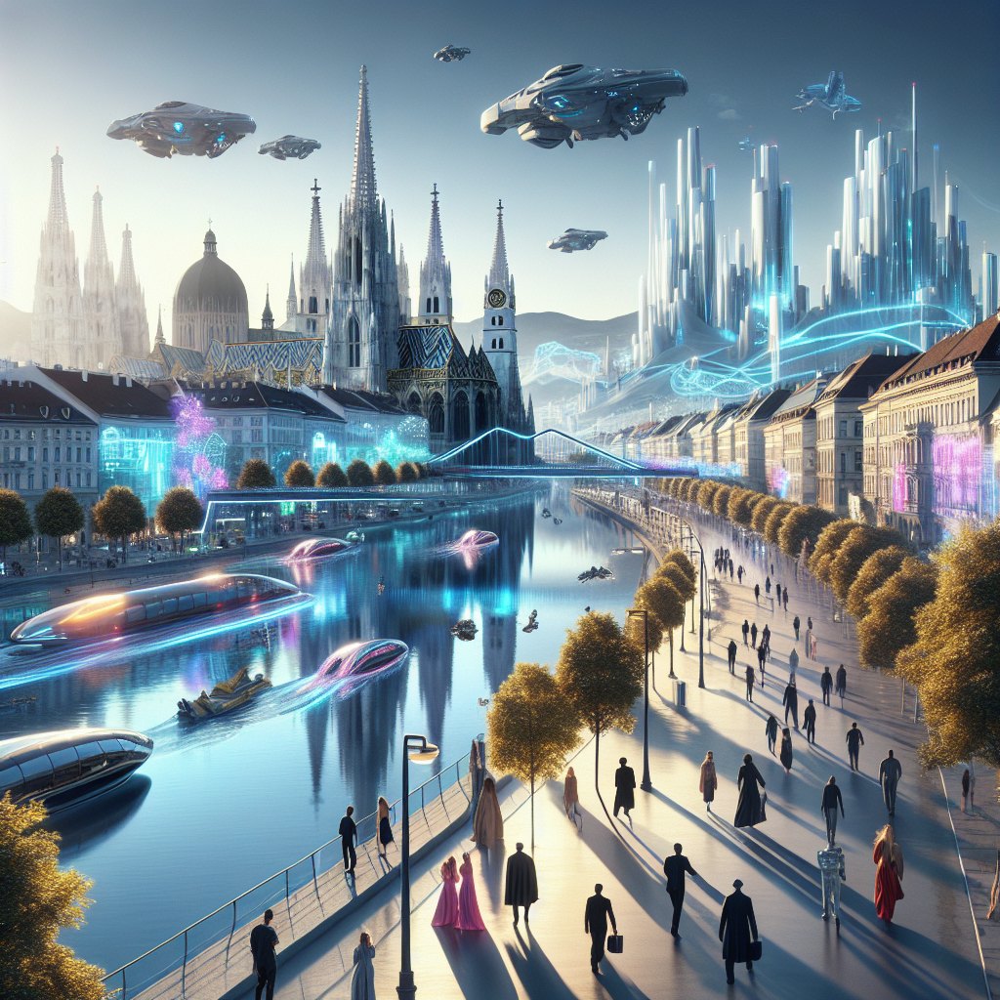

In [31]:
#import base64
Image(base64.decodebytes(str.encode(response.data[0].b64_json)))

In [32]:
with open("../Data/imageToSave.png", "wb") as f:
    f.write(base64.decodebytes(str.encode(response.data[0].b64_json)))

### 4.2 Edits  

Also known as "inpainting", the image edits endpoint allows you to edit or extend an image by uploading an image and mask indicating which areas should be replaced. The transparent areas of the mask indicate where the image should be edited, and the prompt should describe the full new image, not just the erased area. This endpoint can enable experiences like DALL·E image editing in ChatGPT Plus.

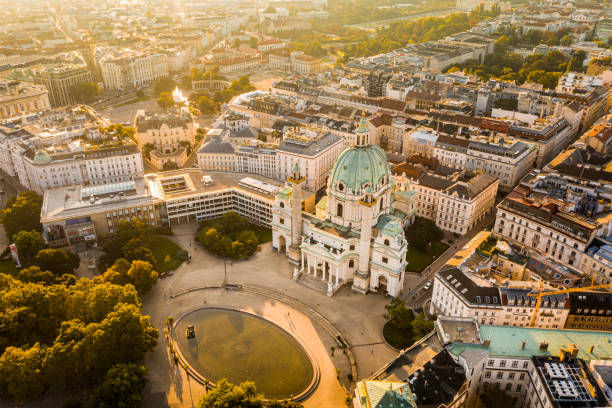

In [53]:
Image("../Data/Vienna_image.png")

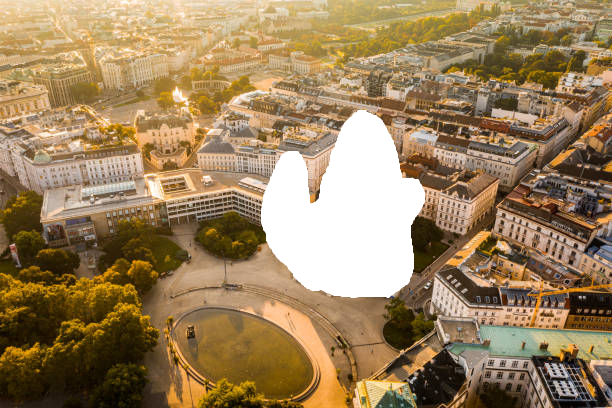

In [54]:
Image("../Data/Vienna_mask.png")

In [59]:
response = client.images.edit(
    model="dall-e-2",
    image=open("../Data/Vienna_image.png", "rb"),
    mask=open("../Data/Vienna_mask.png", "rb"),
    prompt="A new ferris whell in the heart of Vienna",
    response_format='b64_json',
    n=1,
    size="512x512"
)

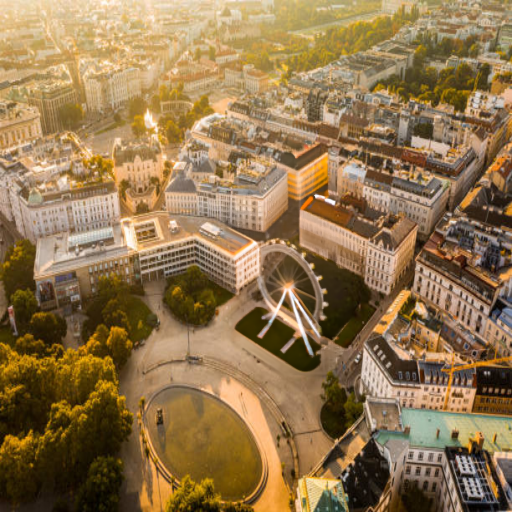

In [60]:
#Image(url=response.data[0].url)
Image(base64.decodebytes(str.encode(response.data[0].b64_json)))

In [61]:
with open("../Data/imageToSave2.png", "wb") as f:
    f.write(base64.decodebytes(str.encode(response.data[0].b64_json)))

### 4.3 Variations (DALL·E 2 only)  
The image variations endpoint allows you to generate a variation of a given image.

In [62]:
response = client.images.create_variation(
    model="dall-e-2",
    image=open("../Data/Vienna_image.png", "rb"),
    n=1,
    response_format='b64_json',
    size="512x512"
)

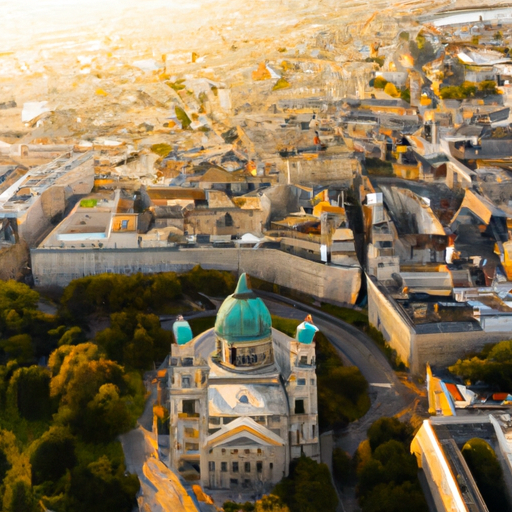

In [63]:
Image(base64.decodebytes(str.encode(response.data[0].b64_json)))

## 5 Video Processing  
While it's not possible to directly send a video to the API, GPT-4o can understand videos if you sample frames and then provide them as images. It performs better at this task than GPT-4 Turbo.

Since GPT-4o in the API does not yet support audio-in (as of Jun 2024), we'll use a combination of GPT-4o and Whisper to process both the audio and visual for a provided video, and showcase two usecases:
1. Summarization
2. Question and Answering

### Setup for Video Processing
We'll use two python packages for video processing - opencv-python and moviepy. 

These require [ffmpeg](https://ffmpeg.org/about.html), so make sure to install this beforehand. Depending on your OS, you may need to run `brew install ffmpeg` or `sudo apt install ffmpeg`

In [14]:
%pip install opencv-python --quiet
%pip install moviepy --quiet

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


### Process the video into two components: frames and audio

In [15]:
import cv2
from moviepy.editor import VideoFileClip
import time
import base64

# We'll be using the OpenAI DevDay Keynote Recap video. You can review the video here: https://www.youtube.com/watch?v=h02ti0Bl6zk
VIDEO_PATH = "../Data/keynote_recap.mp4"

In [16]:
def process_video(video_path, seconds_per_frame=2):
    base64Frames = []
    base_video_path, _ = os.path.splitext(video_path)

    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = video.get(cv2.CAP_PROP_FPS)
    frames_to_skip = int(fps * seconds_per_frame)
    curr_frame=0

    # Loop through the video and extract frames at specified sampling rate
    while curr_frame < total_frames - 1:
        video.set(cv2.CAP_PROP_POS_FRAMES, curr_frame)
        success, frame = video.read()
        if not success:
            break
        _, buffer = cv2.imencode(".jpg", frame)
        base64Frames.append(base64.b64encode(buffer).decode("utf-8"))
        curr_frame += frames_to_skip
    video.release()

    # Extract audio from video
    audio_path = f"{base_video_path}.mp3"
    clip = VideoFileClip(video_path)
    clip.audio.write_audiofile(audio_path, bitrate="32k")
    clip.audio.close()
    clip.close()

    print(f"Extracted {len(base64Frames)} frames")
    print(f"Extracted audio to {audio_path}")
    return base64Frames, audio_path

# Extract 1 frame per second. You can adjust the `seconds_per_frame` parameter to change the sampling rate
base64Frames, audio_path = process_video(VIDEO_PATH, seconds_per_frame=1)


MoviePy - Writing audio in ../Data/keynote_recap.mp3


MoviePy - Done.
Extracted 218 frames
Extracted audio to ../Data/keynote_recap.mp3


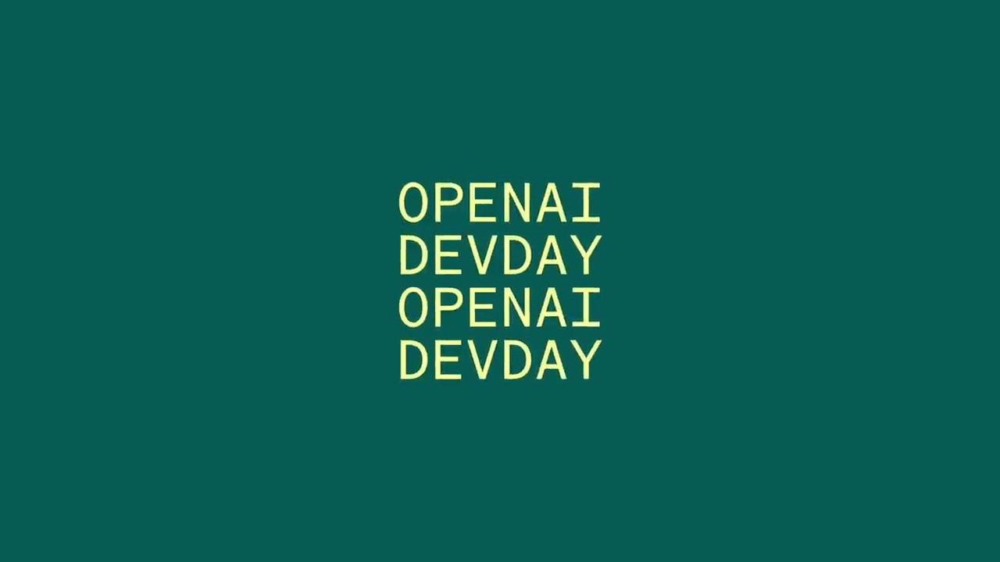

In [17]:
## Display the frames and audio for context
display_handle = display(None, display_id=True)
for img in base64Frames:
    display_handle.update(Image(data=base64.b64decode(img.encode("utf-8")), width=600))
    time.sleep(0.025)

Audio(audio_path)

### Example 1: Summarization
Now that we have both the video frames and the audio, let's run a few different tests to generate a video summary to compare the results of using the models with different modalities. We should expect to see that the summary generated with context from both visual and audio inputs will be the most accurate, as the model is able to use the entire context from the video.

1. Visual Summary
2. Audio Summary
3. Visual + Audio Summary

#### Visual Summary
The visual summary is generated by sending the model only the frames from the video. With just the frames, the model is likely to capture the visual aspects, but will miss any details discussed by the speaker.

In [12]:
response = client.chat.completions.create(
    model=model,
    messages=[
    {"role": "system", "content": "You are generating a video summary. Please provide a summary of the video. Respond in Markdown."},
    {"role": "user", "content": [
        "These are the frames from the video.",
        *map(lambda x: {"type": "image_url", 
                        "image_url": {"url": f'data:image/jpg;base64,{x}', "detail": "low"}}, base64Frames)
        ],
    }
    ],
    temperature=0,
)
print(response.choices[0].message.content)

## Video Summary: OpenAI DevDay Keynote Recap

The video appears to be a keynote recap from OpenAI's DevDay event. Here are the key points covered in the video:

1. **Introduction and Event Overview**:
   - The video starts with the title "OpenAI DevDay" and transitions to "Keynote Recap."
   - The event venue is shown, with attendees gathering and the stage set up.

2. **Keynote Presentation**:
   - A speaker, presumably from OpenAI, takes the stage to present.
   - The presentation covers various topics related to OpenAI's latest developments and announcements.

3. **Announcements**:
   - **GPT-4 Turbo**: Introduction of GPT-4 Turbo, highlighting its enhanced capabilities and performance.
   - **JSON Mode**: A new feature that allows for structured data output in JSON format.
   - **Function Calling**: Demonstration of improved function calling capabilities, making interactions more efficient.
   - **Context Length and Control**: Enhancements in context length and user control over t

The results are as expected - the model is able to capture the high level aspects of the video visuals, but misses the details provided in the speech.

#### Audio Summary
The audio summary is generated by sending the model the audio transcript. With just the audio, the model is likely to bias towards the audio content, and will miss the context provided by the presentations and visuals.

`{audio}` input for GPT-4o isn't currently available but will be coming soon! For now, we use our existing `whisper-1` model to process the audio

In [ ]:
# Transcribe the audio
transcription = client.audio.transcriptions.create(
    model="whisper-1",
    file=open(audio_path, "rb"),
)
## OPTIONAL: Uncomment the line below to print the transcription
#print("Transcript: ", transcription.text + "\n\n")

response = client.chat.completions.create(
    model=MODEL,
    messages=[
    {"role": "system", "content":"""You are generating a transcript summary. Create a summary of the provided transcription. Respond in Markdown."""},
    {"role": "user", "content": [
        {"type": "text", "text": f"The audio transcription is: {transcription.text}"}
        ],
    }
    ],
    temperature=0,
)
print(response.choices[0].message.content)

The audio summary is biased towards the content discussed during the speech, but comes out with much less structure than the video summary.

#### Audio + Visual Summary
The Audio + Visual summary is generated by sending the model both the visual and the audio from the video at once. When sending both of these, the model is expected to better summarize since it can perceive the entire video at once.

In [ ]:
## Generate a summary with visual and audio
response = client.chat.completions.create(
    model=model,
    messages=[
    {"role": "system", "content":"""You are generating a video summary. Create a summary of the provided video and its transcript. Respond in Markdown"""},
    {"role": "user", "content": [
        "These are the frames from the video.",
        *map(lambda x: {"type": "image_url", 
                        "image_url": {"url": f'data:image/jpg;base64,{x}', "detail": "low"}}, base64Frames),
        {"type": "text", "text": f"The audio transcription is: {transcription.text}"}
        ],
    }
],
    temperature=0,
)
print(response.choices[0].message.content)

After combining both the video and audio, we're able to get a much more detailed and comprehensive summary for the event which uses information from both the visual and audio elements from the video.

### Example 2: Question and Answering
For the Q&A, we'll use the same concept as before to ask questions of our processed video while running the same 3 tests to demonstrate the benefit of combining input modalities:
1. Visual Q&A
2. Audio Q&A
3. Visual + Audio Q&A 

In [15]:
QUESTION = "Question: Why did Sam Altman have an example about raising windows and turning the radio on?"

In [16]:
qa_visual_response = client.chat.completions.create(
    model=model,
    messages=[
    {"role": "system", "content": "Use the video to answer the provided question. Respond in Markdown."},
    {"role": "user", "content": [
        "These are the frames from the video.",
        *map(lambda x: {"type": "image_url", "image_url": {"url": f'data:image/jpg;base64,{x}', "detail": "low"}}, base64Frames),
        QUESTION
        ],
    }
    ],
    temperature=0,
)
print("Visual QA:\n" + qa_visual_response.choices[0].message.content)

Visual QA: 
Sam Altman used the example about raising windows and turning the radio on to demonstrate the function calling capability of GPT-4 Turbo. The example illustrated how the model can interpret and execute multiple commands in a more structured and efficient manner. The "before" and "after" comparison showed how the model can now directly call functions like `raise_windows()` and `radio_on()` based on natural language instructions, showcasing improved control and functionality.


In [17]:
qa_audio_response = client.chat.completions.create(
    model=model,
    messages=[
    {"role": "system", "content":"""Use the transcription to answer the provided question. Respond in Markdown."""},
    {"role": "user", "content": f"The audio transcription is: {transcription.text}. \n\n {QUESTION}"},
    ],
    temperature=0,
)
print("Audio QA:\n" + qa_audio_response.choices[0].message.content)

Audio QA:
The provided transcription does not include any mention of Sam Altman or an example about raising windows and turning the radio on. Therefore, I cannot provide an answer based on the given transcription.


In [18]:
qa_both_response = client.chat.completions.create(
    model=model,
    messages=[
    {"role": "system", "content":"""Use the video and transcription to answer the provided question."""},
    {"role": "user", "content": [
        "These are the frames from the video.",
        *map(lambda x: {"type": "image_url", 
                        "image_url": {"url": f'data:image/jpg;base64,{x}', "detail": "low"}}, base64Frames),
                        {"type": "text", "text": f"The audio transcription is: {transcription.text}"},
        QUESTION
        ],
    }
    ],
    temperature=0,
)
print("Both QA:\n" + qa_both_response.choices[0].message.content)

Both QA:
Sam Altman used the example of raising windows and turning the radio on to demonstrate the improved function calling capabilities of GPT-4 Turbo. The example illustrated how the model can now handle multiple function calls more effectively and follow instructions better. In the "before" scenario, the model had to be prompted separately for each action, whereas in the "after" scenario, the model could handle both actions in a single prompt, showcasing its enhanced ability to manage and execute multiple tasks simultaneously.


Comparing the three answers, the most accurate answer is generated by using both the audio and visual from the video. Sam Altman did not discuss the raising windows or radio on during the Keynote, but referenced an improved capability for the model to execute multiple functions in a single request while the examples were shown behind him.

## Conclusion
Integrating many input modalities such as audio, visual, and textual, significantly enhances the performance of the model on a diverse range of tasks. This multimodal approach allows for more comprehensive understanding and interaction, mirroring more closely how humans perceive and process information. 

Currently, GPT-4o in the API supports text and image inputs, with audio capabilities coming soon.

## 6 Moderations  
The moderations endpoint is a tool you can use to check whether text is potentially harmful. Developers can use it to identify content that might be harmful and take action, for instance by filtering it.

The models classifies the following categories:  
Category	Description  
+ hate	Content that expresses, incites, or promotes hate based on race, gender, ethnicity, religion, nationality, sexual orientation, disability status, or caste.
+ Hateful content aimed at non-protected groups (e.g., chess players) is harassment.  
+ hate/threatening	Hateful content that also includes violence or serious harm towards the targeted group based on race, gender, ethnicity, religion, nationality, sexual orientation, disability status, or caste.  
+ harassment	Content that expresses, incites, or promotes harassing language towards any target.  
+ harassment/threatening	Harassment content that also includes violence or serious harm towards any target.  
+ self-harm	Content that promotes, encourages, or depicts acts of self-harm, such as suicide, cutting, and eating disorders.  
+ self-harm/intent	Content where the speaker expresses that they are engaging or intend to engage in acts of self-harm, such as suicide, cutting, and eating disorders.     
+ self-harm/instructions	Content that encourages performing acts of self-harm, such as suicide, cutting, and eating disorders, or that gives instructions or advice on how to commit such acts.  
+ sexual	Content meant to arouse sexual excitement, such as the description of sexual activity, or that promotes sexual services (excluding sex education and wellness).
+ sexual/minors	Sexual content that includes an individual who is under 18 years old.  
+ violence	Content that depicts death, violence, or physical injury.  
+ violence/graphic	Content that depicts death, violence, or physical injury in graphic detail.  

The moderation endpoint is free to use for most developers. For higher accuracy, try splitting long pieces of text into smaller chunks each less than 2,000 characters.

In [64]:
#from openai import OpenAI
#client = OpenAI()

# Examples from: https://www.politico.eu/article/15-most-offensive-things-trump-campaign-feminism-migration-racism/

sample_text = """
“I have black guys counting my money. … I hate it,” Trump told John R. O’Donnell, the former president of Trump Plaza Hotel & Casino, 
according O’Donnell’s account in his 1991 book “Trumped!” “The only guys I want counting my money are short guys that wear yarmulkes all day.”
Trump, according to O’Donnell, went on to say, “‘Laziness is a trait in blacks. It really is, I believe that.”
"""

response = client.moderations.create(input=sample_text)

In [69]:
print(response.to_json())

{
  "id": "modr-9XH2DD7WrfCQRQ7cRC6eMCwfAN3Vy",
  "model": "text-moderation-007",
  "results": [
    {
      "categories": {
        "harassment": true,
        "harassment/threatening": false,
        "hate": false,
        "hate/threatening": false,
        "self-harm": false,
        "self-harm/instructions": false,
        "self-harm/intent": false,
        "sexual": false,
        "sexual/minors": false,
        "violence": false,
        "violence/graphic": false
      },
      "category_scores": {
        "harassment": 0.4619237780570984,
        "harassment/threatening": 0.00011210115189896896,
        "hate": 0.012480752542614937,
        "hate/threatening": 5.161022272659466e-06,
        "self-harm": 1.841225821408443e-05,
        "self-harm/instructions": 2.3661930015350663e-07,
        "self-harm/intent": 1.019623823594884e-06,
        "sexual": 0.00010969231516355649,
        "sexual/minors": 1.4072171552470536e-06,
        "violence": 9.163955837721005e-05,
        "viole